In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
#IMPORTS
import numpy as np
import os
import pandas as pd
import matplotlib.pyplot as plt
import datetime

from src.data.make_dataset import *
from src.data.modal_data import *

In [4]:
loc = 'nw2'
turbine = 'c02'
mode = 'whirling'

In [5]:
# GET THE DATA
package_folder = os.path.dirname(os.path.dirname(os.path.dirname(os.getcwd())))
data_folder = os.path.join(package_folder, 'data')
selected_data= pd.read_parquet(os.path.join(data_folder, 'processed','nw2',mode, turbine+'_' + mode + '_selected_data.parquet'))


In [6]:
from src.data.utils import get_input_data
from src.data.harmonics import *

data = get_input_data(data_folder, loc, turbine)
harmonics_data = harmonics(data['turbine_data'].filter(regex='rpm'), [1,3,6, 9])

In [7]:
selected_columns = ['mean_NW2_C02_rpm', 'mean_NW2_C02_pitch', 'mean_NW2_C02_power',
       'mean_NW2_C02_windspeed', 'sin_mean_NW2_C02_yaw',
       'cos_mean_NW2_C02_yaw', 'sin_mean_NW2_C02_winddirection',
       'cos_mean_NW2_C02_winddirection',
       'mvbc_WandelaarBuoy_Wave_height',
       'mvbc_WandelaarBuoy_Average_wave_period',
       'mvbc_WandelaarMeasuringpile_Tide_TAW',
       'mvbc_WandelaarMeasuringpile_Air_pressure',
       'mvbc_WandelaarMeasuringpile_Air_temperature'
       ]

In [8]:
from src.data.make_dataset import create_input_data
mpe_ss_data = get_mpe_data(data['turbine_data'], 'SS', loc, turbine)

X = create_input_data(data_folder, loc, turbine)
X = X[selected_columns].loc[:datetime.datetime(2023, 6, 1, tzinfo=datetime.timezone.utc)]
y_train = selected_data['mean_frequency']

common_indices = X.dropna().index.intersection(y_train.dropna().index)
y_train = y_train.loc[common_indices]
X_train = pd.DataFrame(index = y_train.index)
for column in selected_columns:
    X_train[column] = X[column].loc[common_indices]

dropped mvbc columns:  {'mvbc_WandelaarMeasuringpile_Relative_humidity', 'mvbc_WandelaarBuoy_Sea_water_temperature'}


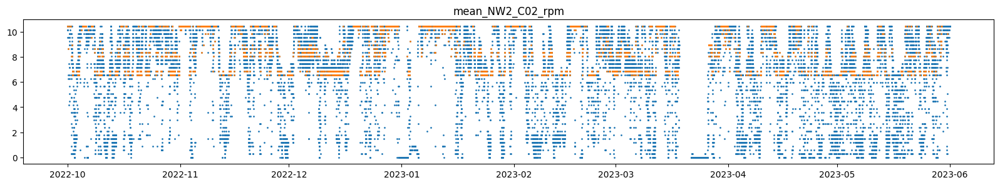

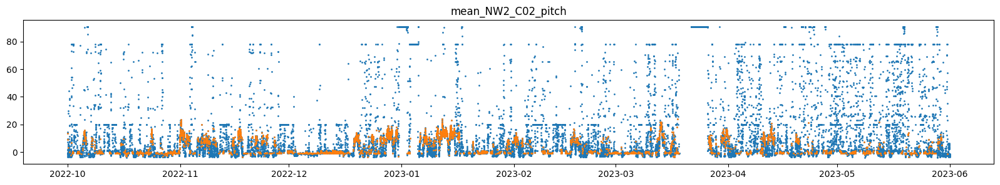

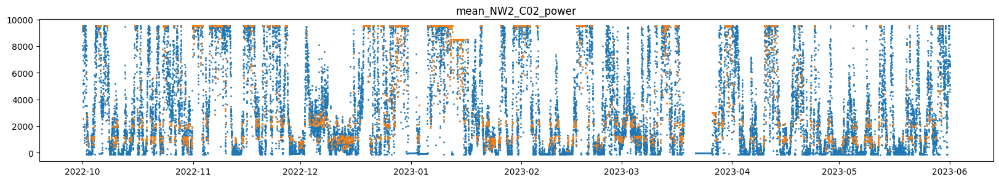

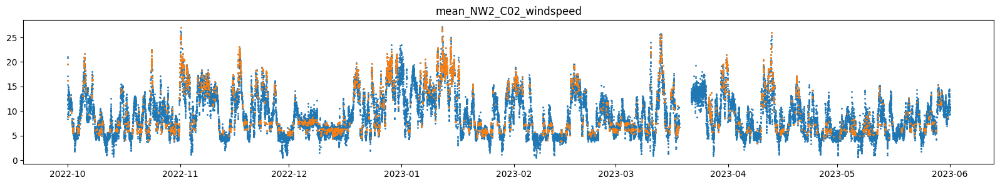

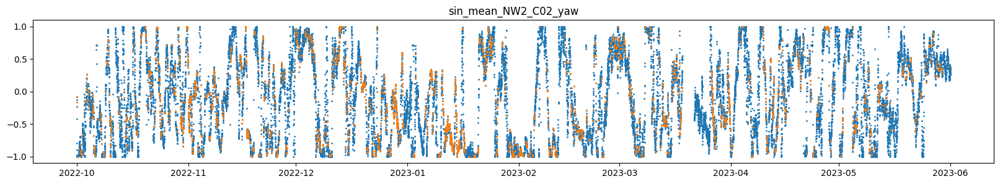

...

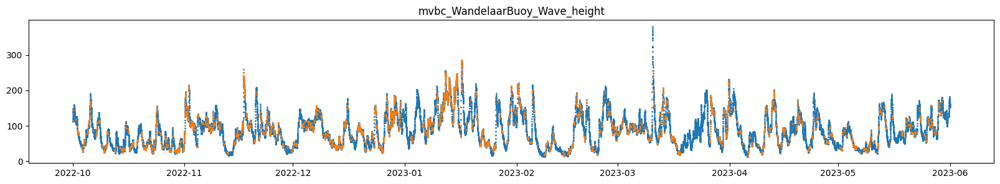

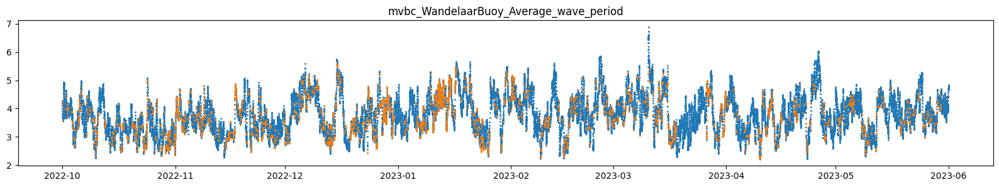

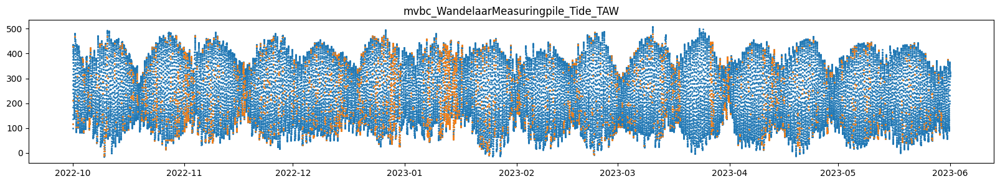

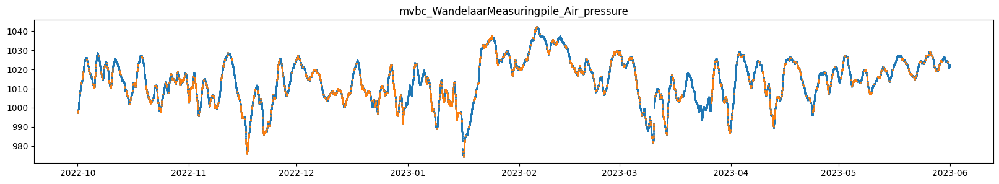

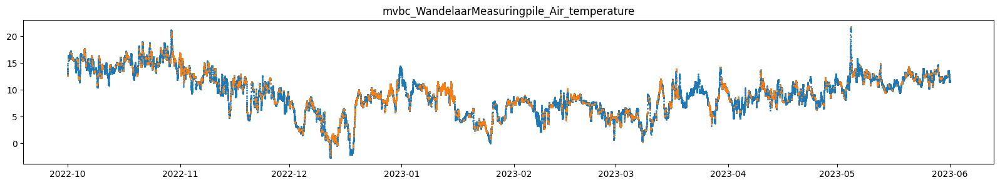

In [9]:
for col in X.columns:
    plt.figure(figsize=(20,3))
    plt.scatter(X.index, X[col], s=1)
    plt.scatter(X_train.index, X_train[col], color='tab:orange', s=1)
    plt.title(col)
    plt.show()
    plt.close()

In [10]:
lower_freq = 0.6
upper_freq = 0.77
all_whirling = mpe_ss_data[(mpe_ss_data['mean_frequency'] < upper_freq) & (mpe_ss_data['mean_frequency'] > lower_freq)]

In [11]:
from catboost import CatBoostRegressor
regr_model = CatBoostRegressor(iterations=2000, depth=3, learning_rate=0.5, l2_leaf_reg=1, random_seed=0,posterior_sampling=True, loss_function='RMSEWithUncertainty', verbose=False)
regr_model.fit(X_train, y_train)

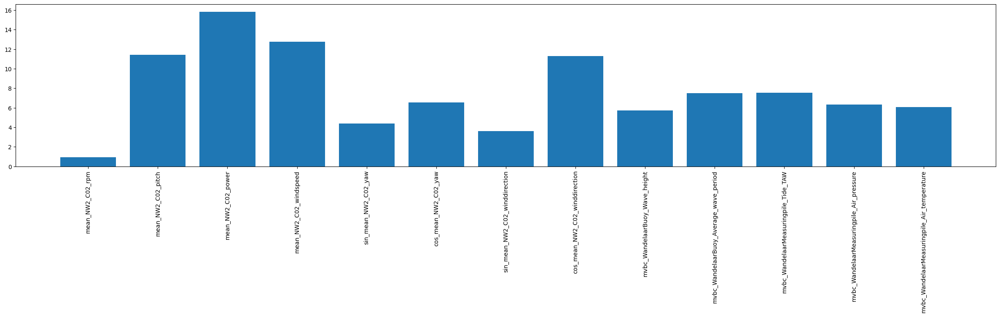

In [12]:
plt.figure(figsize=(30,5))
plt.bar(regr_model.feature_names_, regr_model.feature_importances_)
plt.xticks(rotation=90)
plt.show()
plt.close()

In [13]:
import pickle
models_folder = os.path.join(package_folder, 'models', loc)
model_path = os.path.join(models_folder, turbine, mode, '_'.join([loc, turbine, mode, 'catboost_model.pkl']))
with open(model_path, 'wb') as file:
    pickle.dump(regr_model, file)

In [14]:
# Full model predictions
predictions = regr_model.predict(X)
predictions_df = pd.DataFrame(predictions, columns=['prediction', 'spread'], index=X.index)

predictions_df.to_parquet(os.path.join(data_folder, 'processed', loc, mode, turbine + '_' + mode + '_predictions.parquet'))
predicted_value = predictions[:,0]
predicted_total_uncertainty = predictions[:,1]

# Virtual ensemble predictions
virtual_ensemble_preds = regr_model.virtual_ensembles_predict(X, prediction_type='TotalUncertainty', virtual_ensembles_count=100, ntree_end=500) #, virtual_ensembles_count=100, ntree_end=200)
virtual_ensemble_preds_df = pd.DataFrame(virtual_ensemble_preds, columns=['prediction', 'knowledge uncertainty', 'data uncertainty'], index=X.index)

virtual_ensemble_preds_mean = virtual_ensemble_preds[:,0] # mean values predicted by a virtual ensemble
knowledge_uncertainty = virtual_ensemble_preds[:,1] # knowledge uncertainty predicted by a virtual ensemble
data_uncertainty = virtual_ensemble_preds[:,2] # average estimated data uncertainty

predictions_df['virtual_ensemble_mean'] = virtual_ensemble_preds_mean
predictions_df['knowledge_uncertainty'] = knowledge_uncertainty
predictions_df['data_uncertainty'] = data_uncertainty

uncertainty_ = pd.Series(knowledge_uncertainty, index=X.index).copy()
uncertainty_moving_avg = pd.Series(uncertainty_, index=X.index).rolling(6*6, center=True).mean()

uncertainty_lim = uncertainty_.loc[X_train.dropna().index].quantile(0.9)
prediction_lim = (y_train - predictions_df['prediction'].loc[X_train.dropna().index]).std()*3

In [35]:
prediction_lim

0.0182747553292923

In [36]:
uncertainty_lim

4.0609205553384383e-07

C:\Users\Max\AppData\Local\Temp\ipykernel_30344\2865007364.py:14: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend1.legendHandles:
C:\Users\Max\AppData\Local\Temp\ipykernel_30344\2865007364.py:41: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in combined_legend.legendHandles:


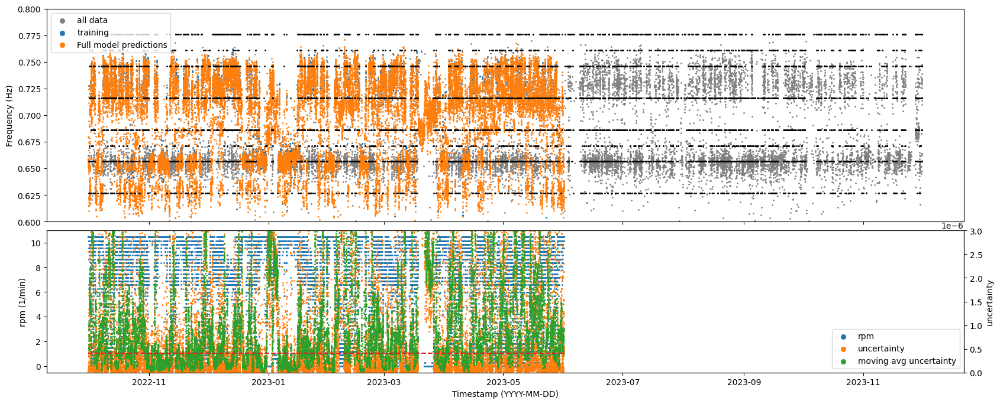

In [15]:
# Create two subplots with shared x-axis
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(20, 8), sharex=True, gridspec_kw={'height_ratios': [3, 2]})

# Plot on the first subplot
ax1.scatter(all_whirling.index, all_whirling['mean_frequency'], s=1, color='gray', label='all data')
ax1.scatter(y_train.index, y_train, s=1, color='tab:blue', label='training')
ax1.scatter(predictions_df.index, predictions_df['prediction'], s=1, color='tab:orange', label='Full model predictions')
#ax1.scatter(smart_tracked_modes.index, smart_tracked_modes['frequency'], s=5, color='tab:orange', label='Smart tracking')
legend1 = ax1.legend(loc='upper left')

for harmonic in harmonics_data:
    ax1.scatter(harmonics_data.index, harmonics_data[harmonic], s=1, color='k')

for handle in legend1.legendHandles:
    handle.set_sizes([30])
ax1.set_ylabel('Frequency (Hz)')
ax1.set_ylim(0.6, 0.8)
# Plot on the second subplot
ax2.scatter(X.index, X.filter(regex='rpm'), label='rpm', s=1, color='tab:blue')
ax2.set_ylabel('rpm (1/min)')
ax2.set_xlabel('Timestamp (YYYY-MM-DD)')

ax3 = ax2.twinx()
ax3.scatter(uncertainty_.index,uncertainty_, label='uncertainty', s=1, color='tab:orange')
ax3.scatter(uncertainty_moving_avg.index,uncertainty_moving_avg, label='moving avg uncertainty', s=1, color='tab:green')

ax3.hlines(uncertainty_lim, uncertainty_.index[0], uncertainty_.index[-1], color='tab:red', linestyles='dashed')
ax3.set_ylabel('uncertainty')
ax3.set_ylim(0, 3*1e-6)

# Collect handles and labels for ax2 and ax3
handles2, labels2 = ax2.get_legend_handles_labels()
handles3, labels3 = ax3.get_legend_handles_labels()

# Combine handles and labels
combined_handles = handles2 + handles3
combined_labels = labels2 + labels3

# Create a single combined legend
combined_legend = plt.legend(combined_handles, combined_labels, loc='lower right')
for handle in combined_legend.legendHandles:
    handle.set_sizes([30])

# Set shared x-axis properties
plt.subplots_adjust(hspace=0.05)  # Adjust this value as needed

plt.show()
plt.close()

In [16]:
# Smart tracking
from src.smart_tracking.smart_tracking import *

smart_tracked_modes = smart_tracking(
    all_whirling['mean_frequency'],
    predictions_df['prediction'],
    uncertainty_,
    uncertainty_lim,
    prediction_lim
    )

smart_tracked_modes.to_parquet(os.path.join(data_folder, 'processed', loc, mode, turbine+'_' + mode + '_smart_tracked_modes.parquet'))

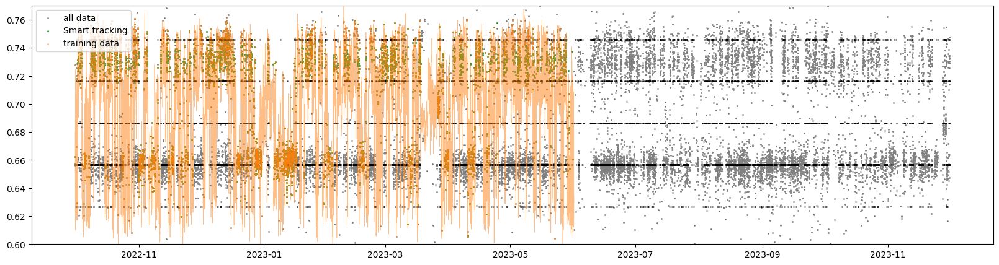

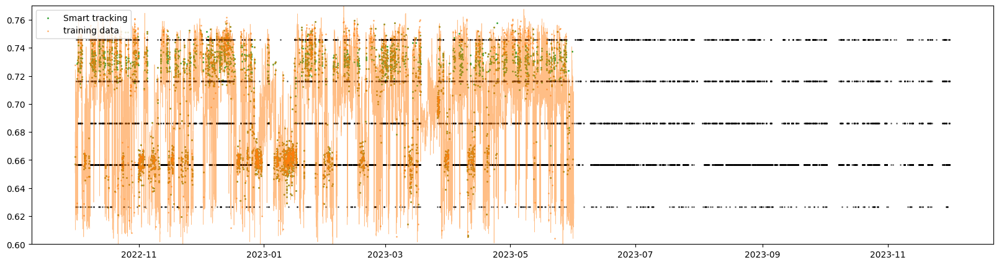

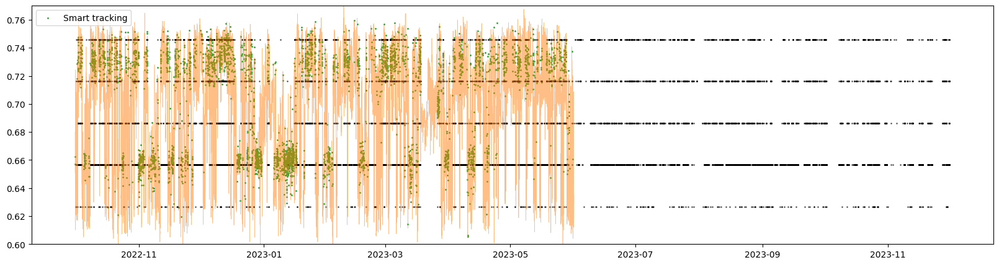

In [17]:
plt.figure(figsize=(20,5))
plt.plot(predictions_df['prediction'], color='tab:orange', linewidth = 0.5, alpha=0.5)

plt.scatter(all_whirling.index, all_whirling['mean_frequency'], s=1, color='gray', label='all data')
#plt.scatter(predictions_df.index, predictions_df['prediction'],color='tab:blue', s=1, alpha=0.5)
plt.scatter(smart_tracked_modes.index, smart_tracked_modes['frequency'], s=1, color='tab:green', label='Smart tracking')
plt.scatter(y_train.index, y_train, s=1, alpha=0.5, color='tab:orange', label='training data')
for harmonic in harmonics_data.columns[:-1]:
    plt.scatter(harmonics_data[harmonic].index, harmonics_data[harmonic], color='k', alpha=0.5, s=1)
#plt.scatter(predictions_df.index, predictions_df['prediction'], s=1, alpha=0.5)
plt.legend(loc='upper left')
plt.ylim(0.6, 0.77)
plt.show()
plt.close()

plt.figure(figsize=(20,5))
plt.plot(predictions_df['prediction'], color='tab:orange', linewidth = 0.5, alpha=0.5)

plt.scatter(smart_tracked_modes.index, smart_tracked_modes['frequency'], s=1, color='tab:green', label='Smart tracking')
plt.scatter(y_train.index, y_train, s=1, alpha=0.5, color='tab:orange', label='training data')
for harmonic in harmonics_data.columns[:-1]:
    plt.scatter(harmonics_data[harmonic].index, harmonics_data[harmonic], color='k', alpha=0.5, s=1)
#plt.scatter(predictions_df.index, predictions_df['prediction'], s=1, alpha=0.5)
plt.legend(loc='upper left')
plt.ylim(0.6, 0.77)
plt.show()
plt.close()

plt.figure(figsize=(20,5))
plt.plot(predictions_df['prediction'], color='tab:orange', linewidth = 0.5, alpha=0.5)

plt.scatter(smart_tracked_modes.index, smart_tracked_modes['frequency'], s=1, color='tab:green', label='Smart tracking')
for harmonic in harmonics_data.columns[:-1]:
    plt.scatter(harmonics_data[harmonic].index, harmonics_data[harmonic], color='k', alpha=0.5, s=1)
#plt.scatter(predictions_df.index, predictions_df['prediction'], s=1, alpha=0.5)
plt.legend(loc='upper left')
plt.ylim(0.6, 0.77)
plt.show()
plt.close()

(4.0, 12.0)

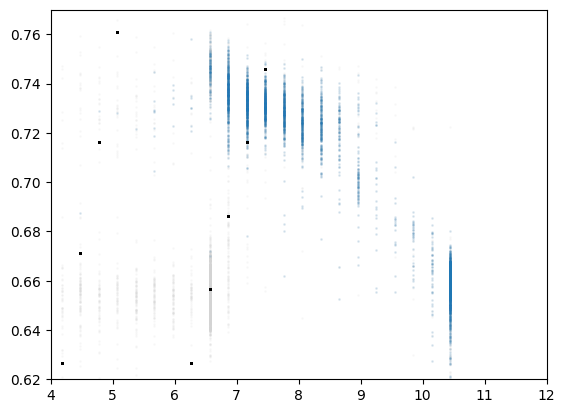

In [18]:
smart_tracked_modes['rpm'] = X.loc[smart_tracked_modes.index, 'mean_NW2_C02_rpm']
h_X_common_indices = harmonics_data.index.intersection(X.index)
harmonics_data['rpm'] = X.loc[h_X_common_indices, 'mean_NW2_C02_rpm']
common_indices = all_whirling.index.intersection(X.index)
all_whirling_ = all_whirling.loc[common_indices]
all_whirling_['rpm'] = X.loc[common_indices, 'mean_NW2_C02_rpm']
plt.scatter(all_whirling_['rpm'], all_whirling_['mean_frequency'], s=1, alpha=0.1, color='lightgrey')
plt.scatter(smart_tracked_modes['rpm'], smart_tracked_modes['frequency'], s=1, alpha=0.1)
for harmonic in harmonics_data.columns[:-1]:
    plt.scatter(harmonics_data['rpm'], harmonics_data[harmonic], color='k', alpha=0.5, s=1)
plt.ylim(0.62, 0.77)
plt.xlim(4,12)

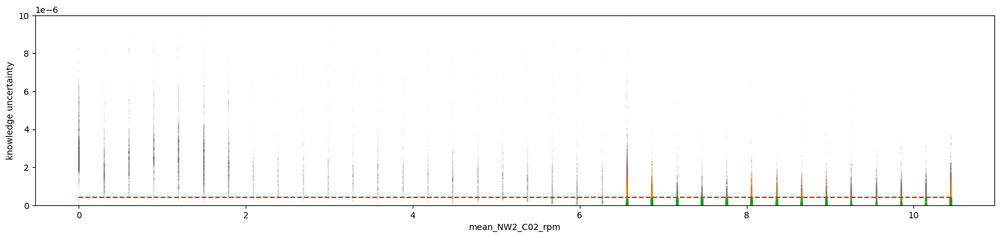

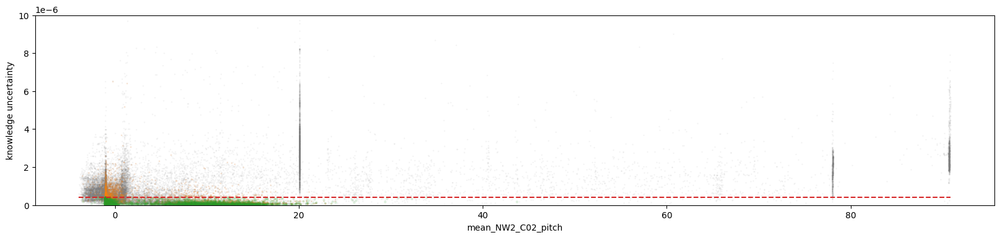

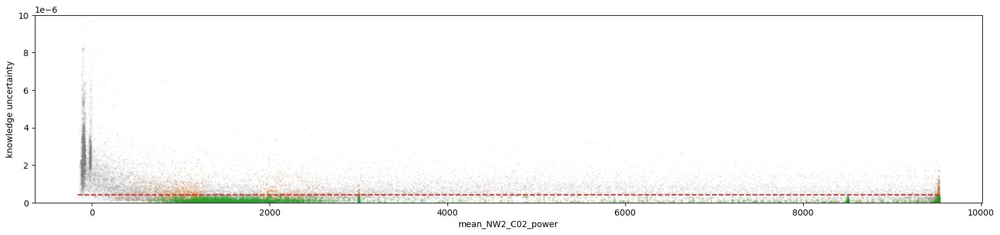

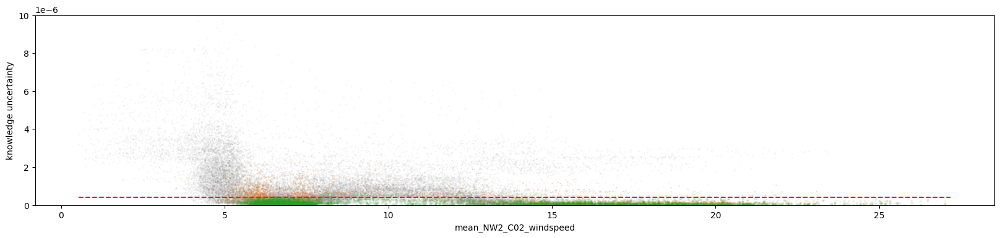

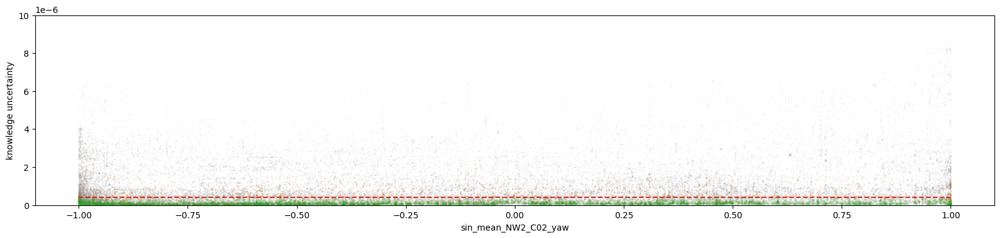

...

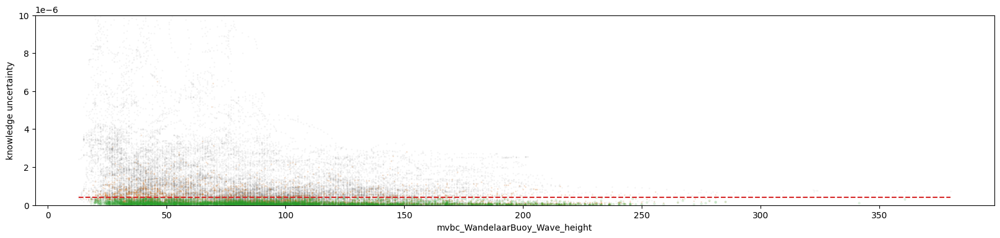

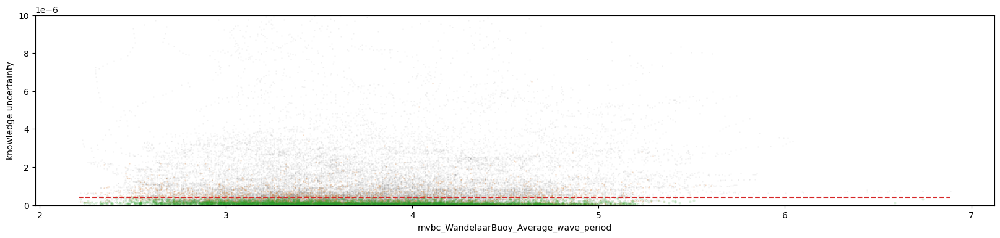

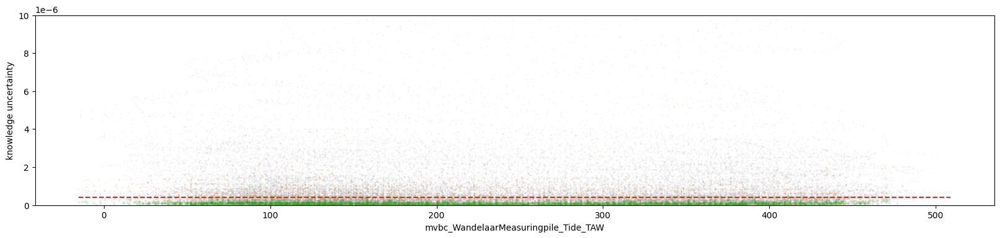

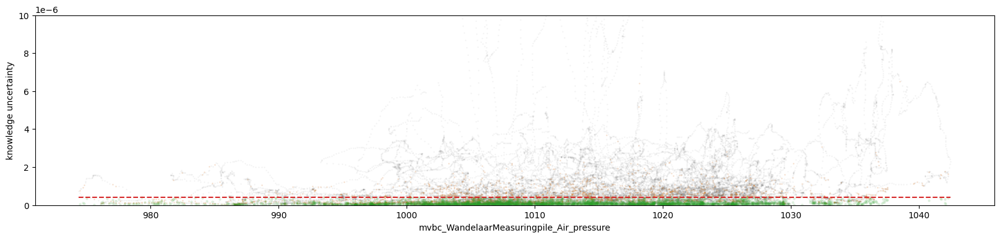

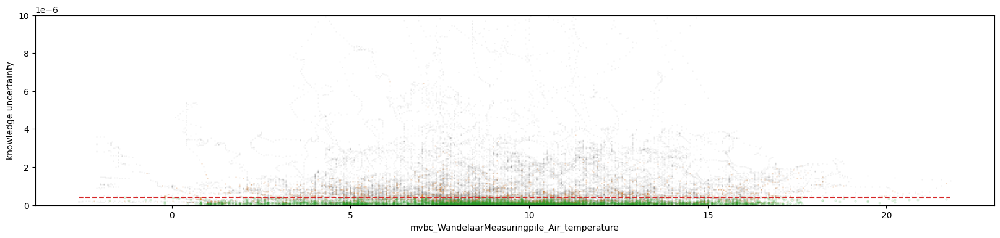

In [19]:
for col in X.columns:
    plt.figure(figsize=(20,4))
    plt.scatter(X[col], uncertainty_moving_avg, s=1, alpha=0.05, color='grey')
    plt.scatter(X[col].loc[X_train.index], uncertainty_moving_avg.loc[X_train.index], s=1, alpha=0.1, color='tab:orange')
    plt.scatter(X[col].loc[smart_tracked_modes.index], uncertainty_.loc[smart_tracked_modes.index], s=5, alpha=0.1, color='tab:green')

    plt.xlabel(col)
    plt.ylabel('knowledge uncertainty')
    plt.ylim(-1e-9, 10*1e-6)
    plt.hlines(uncertainty_lim, X[col].min(), X[col].max(), color='tab:red', linestyles='dashed')
    plt.show()
    plt.close()

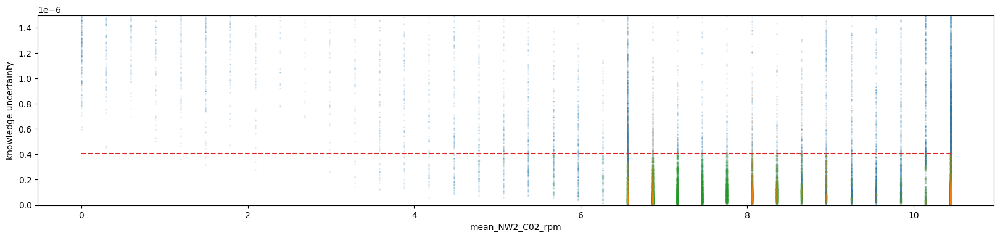

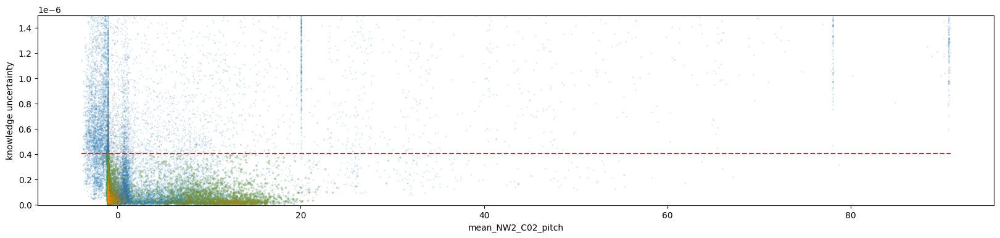

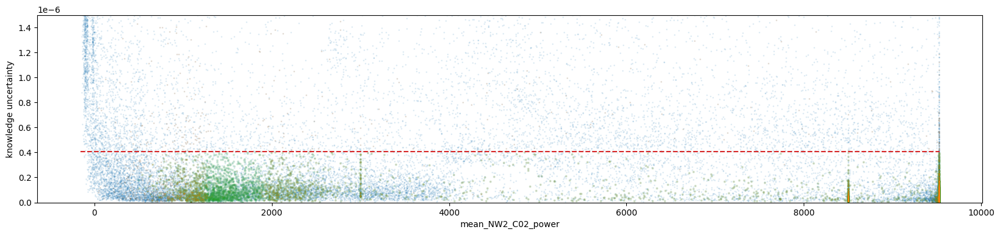

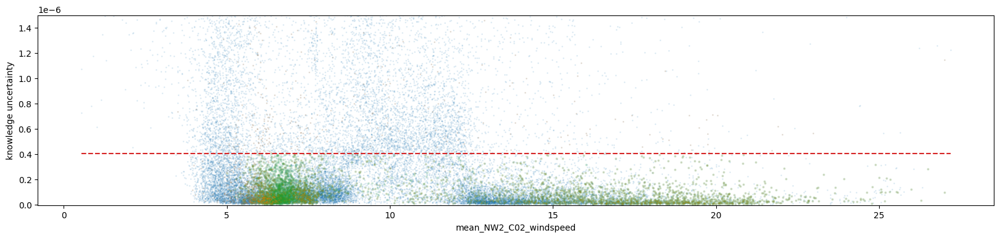

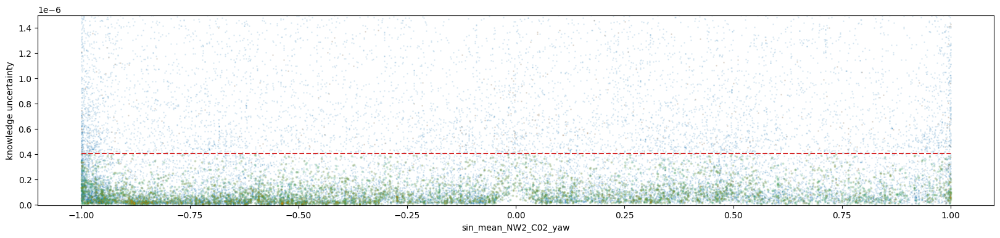

...

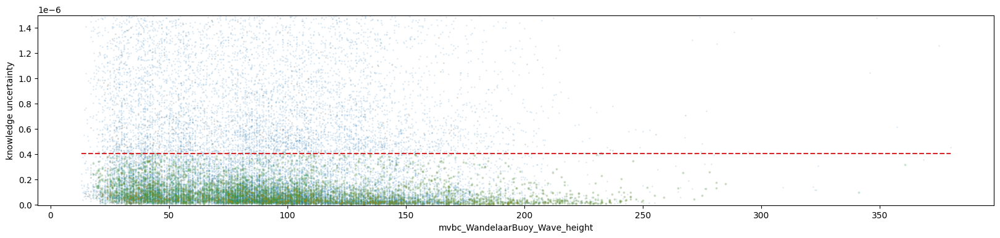

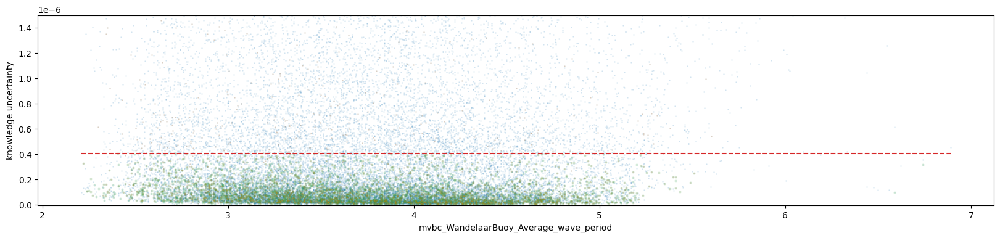

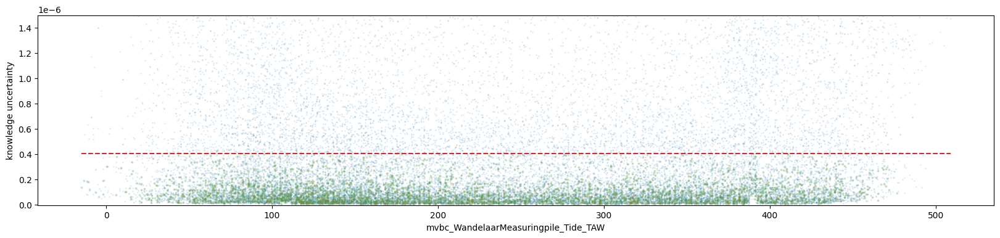

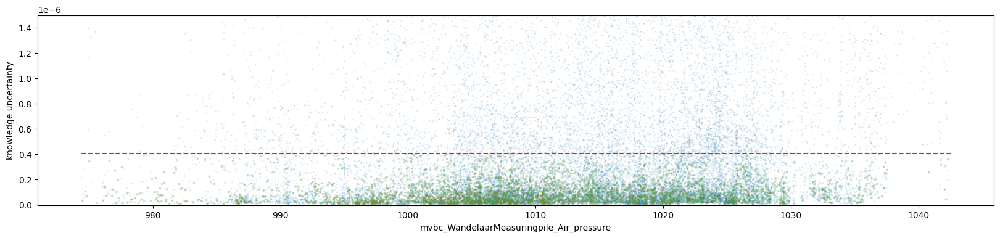

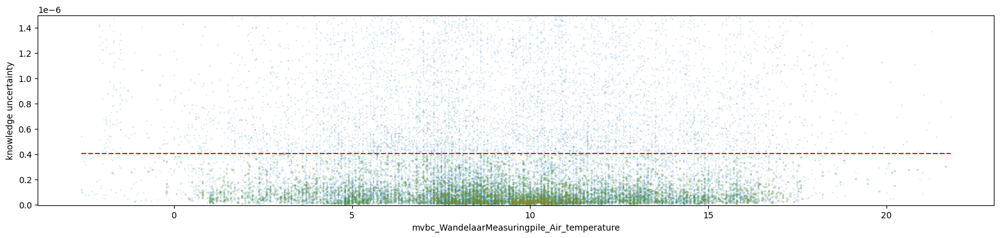

In [20]:

for col in X.columns:
    plt.figure(figsize=(20,4))
    plt.scatter(X[col], predictions_df['knowledge_uncertainty'], s=1, alpha=0.1)
    plt.scatter(X[col].loc[smart_tracked_modes.index], predictions_df['knowledge_uncertainty'].loc[smart_tracked_modes.index], s=5, alpha=0.1, color='tab:green')
    plt.scatter(X[col].loc[X_train.index], predictions_df['knowledge_uncertainty'].loc[X_train.index], s=1, alpha=0.1)
    plt.xlabel(col)
    plt.ylabel('knowledge uncertainty')
    plt.ylim(-1e-9, 1.5*1e-6)
    plt.hlines(uncertainty_lim, X[col].min(), X[col].max(), color='tab:red', linestyles='dashed')
    plt.show()
    plt.close()

C:\Users\Max\AppData\Local\Temp\ipykernel_30344\2269479091.py:19: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handles in legend.legendHandles:


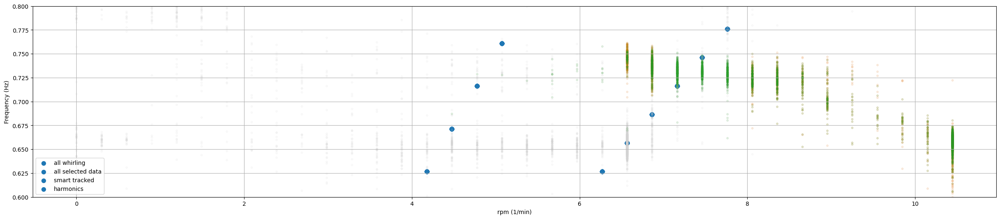

In [21]:
campbell_data = pd.DataFrame({'frequency': mpe_ss_data['mean_frequency']}, index=mpe_ss_data.index)
campbell_data['rpm'] = X.filter(regex='rpm').loc[campbell_data.index.intersection(X.index)]
harmonics_data['rpm'] = X.filter(regex='rpm').loc[harmonics_data.index.intersection(X.index)]
smart_tracked_modes['rpm'] = X.filter(regex='rpm').loc[smart_tracked_modes.index]

campbell_data_train = pd.DataFrame({'frequency': y_train}, index=y_train.index)
campbell_data_train['rpm'] = X_train.filter(regex='rpm')
plt.figure(figsize=(30,6))
for harmonic in harmonics_data.columns[:-1]:
    plt.scatter(harmonics_data['rpm'], harmonics_data[harmonic], s=50, alpha=1.0, color='tab:blue')
plt.scatter(campbell_data['rpm'], campbell_data['frequency'], s=10, alpha=0.1, color='lightgrey')
#plt.scatter(mpe_ss_data_lowrpm.index, mpe_ss_data_lowrpm['mean_frequency'], s=10, alpha=0.6, color='tab:green')
plt.scatter(campbell_data_train['rpm'], campbell_data_train['frequency'], s=10, alpha=0.1, color='tab:orange')
plt.scatter(smart_tracked_modes['rpm'], smart_tracked_modes['frequency'], s=10, alpha=0.1, color='tab:green')


plt.ylim(0, 1.15)
legend = plt.legend(loc='lower left', labels=['all whirling', 'all selected data', 'smart tracked', 'harmonics'])
for handles in legend.legendHandles:
    handles.set_sizes([50])
    handles.set_alpha(1.0)
plt.xlabel('rpm (1/min)')
plt.ylabel('Frequency (Hz)')
plt.ylim(0.6, 0.8)
plt.grid()
plt.show()
plt.close()

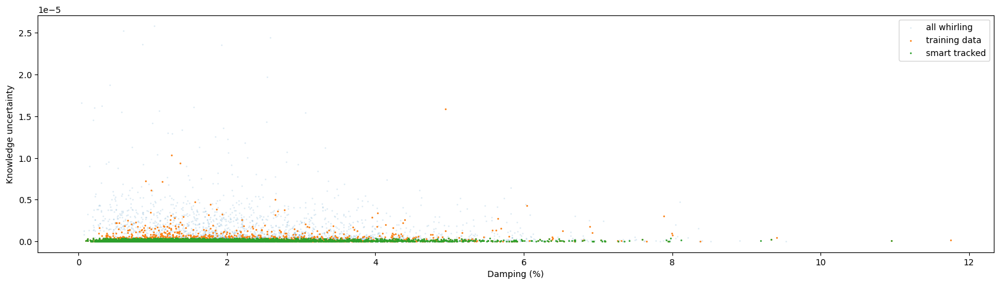

In [22]:
all_whirling_ = all_whirling.copy()
all_whirling_['uncertainty'] = uncertainty_
plt.figure(figsize=(20,5))
plt.scatter(all_whirling['mean_damping'], all_whirling_['uncertainty'], s=1, alpha=0.1, label='all whirling')
plt.scatter(all_whirling['mean_damping'].loc[y_train.index.intersection(all_whirling.index)],all_whirling_['uncertainty'].loc[y_train.index.intersection(all_whirling.index)],  s=1, label='training data')
plt.scatter( all_whirling['mean_damping'].loc[smart_tracked_modes.index.intersection(all_whirling.index)], all_whirling_['uncertainty'].loc[smart_tracked_modes.index.intersection(all_whirling.index)],s=1, label='smart tracked')
plt.legend()
plt.xlabel('Damping (%)')
plt.ylabel('Knowledge uncertainty')
plt.show()
plt.close()

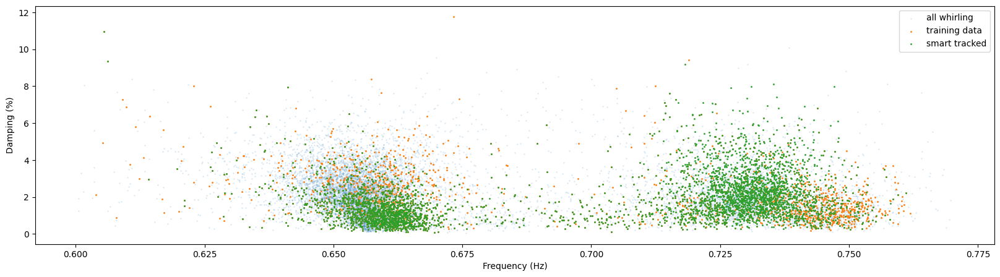

In [23]:
all_whirling_ = all_whirling.copy()
all_whirling_['uncertainty'] = uncertainty_
plt.figure(figsize=(20,5))
plt.scatter(all_whirling['mean_frequency'], all_whirling_['mean_damping'], s=1, alpha=0.1, label='all whirling')
plt.scatter(all_whirling['mean_frequency'].loc[y_train.index.intersection(all_whirling.index)],all_whirling_['mean_damping'].loc[y_train.index.intersection(all_whirling.index)],  s=1, label='training data')
plt.scatter( all_whirling['mean_frequency'].loc[smart_tracked_modes.index.intersection(all_whirling.index)], all_whirling_['mean_damping'].loc[smart_tracked_modes.index.intersection(all_whirling.index)],s=1, label='smart tracked')
plt.legend()
plt.xlabel('Frequency (Hz)')
plt.ylabel('Damping (%)')
plt.show()
plt.close()

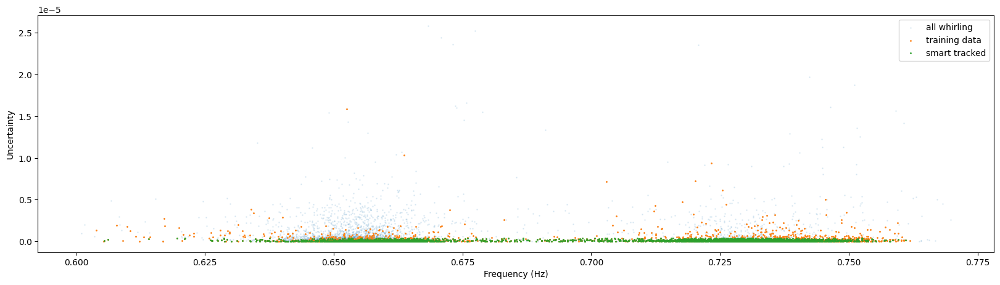

In [24]:
all_whirling_ = all_whirling.copy()
all_whirling_['uncertainty'] = uncertainty_
plt.figure(figsize=(20,5))
plt.scatter(all_whirling['mean_frequency'], all_whirling_['uncertainty'], s=1, alpha=0.1, label='all whirling')
plt.scatter(all_whirling['mean_frequency'].loc[y_train.index.intersection(all_whirling.index)],all_whirling_['uncertainty'].loc[y_train.index.intersection(all_whirling.index)],  s=1, label='training data')
plt.scatter( all_whirling['mean_frequency'].loc[smart_tracked_modes.index.intersection(all_whirling.index)], all_whirling_['uncertainty'].loc[smart_tracked_modes.index.intersection(all_whirling.index)],s=1, label='smart tracked')
plt.legend()
plt.xlabel('Frequency (Hz)')
plt.ylabel('Uncertainty')
plt.show()
plt.close()

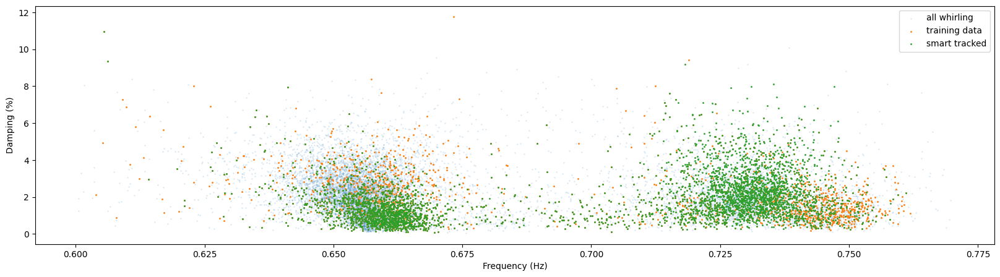

In [25]:
plt.figure(figsize=(20,5))
plt.scatter(all_whirling['mean_frequency'], all_whirling['mean_damping'], s=1, alpha=0.1, label='all whirling')
plt.scatter(all_whirling['mean_frequency'].loc[y_train.index.intersection(all_whirling.index)],all_whirling['mean_damping'].loc[y_train.index.intersection(all_whirling.index)],  s=1, label='training data')
plt.scatter( all_whirling['mean_frequency'].loc[smart_tracked_modes.index.intersection(all_whirling.index)], all_whirling['mean_damping'].loc[smart_tracked_modes.index.intersection(all_whirling.index)],s=1, label='smart tracked')
plt.legend()
plt.xlabel('Frequency (Hz)')
plt.ylabel('Damping (%)')
plt.show()
plt.close()


C:\Users\Max\AppData\Local\Temp\ipykernel_30344\2127762180.py:16: MatplotlibDeprecationWarning: The legendHandles attribute was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use legend_handles instead.
  for handle in legend.legendHandles:


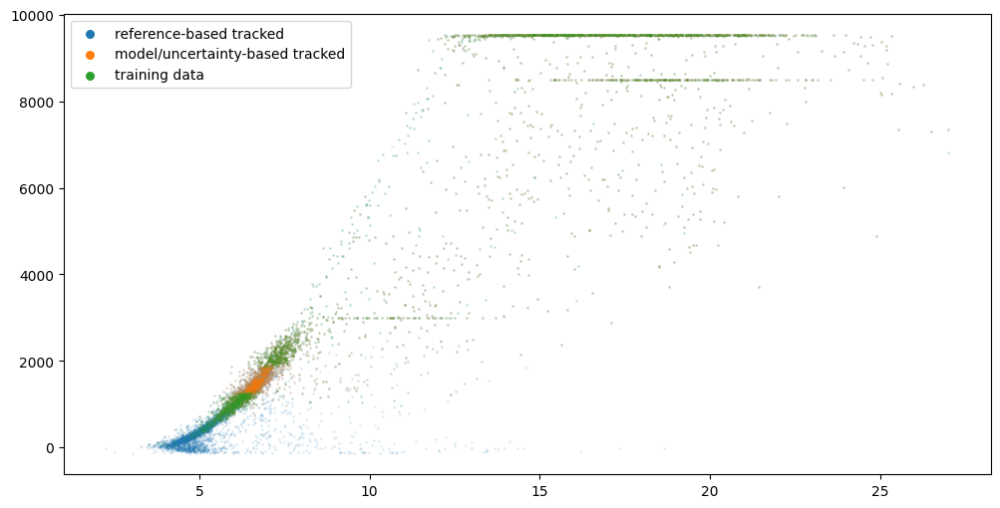

In [26]:
plt.figure(figsize=(12,6))
plt.scatter(
    X.loc[all_whirling.index.intersection(X.index), 'mean_NW2_C02_windspeed'],
    X.loc[all_whirling.index.intersection(X.index), 'mean_NW2_C02_power'],
    s=1, alpha=0.1, label='reference-based tracked')

plt.scatter(
    X.loc[smart_tracked_modes.index.intersection(X.index), 'mean_NW2_C02_windspeed'],
    X.loc[smart_tracked_modes.index.intersection(X.index), 'mean_NW2_C02_power'],
    s=1, alpha=0.1, label='model/uncertainty-based tracked')
plt.scatter(
    X.loc[y_train.index.intersection(X.index), 'mean_NW2_C02_windspeed'],
    X.loc[y_train.index.intersection(X.index), 'mean_NW2_C02_power'],
    s=1, alpha=0.1, label='training data')
legend = plt.legend()
for handle in legend.legendHandles:
    handle.set_sizes([30])
    handle.set_alpha(1.0)

plt.show()
plt.close()

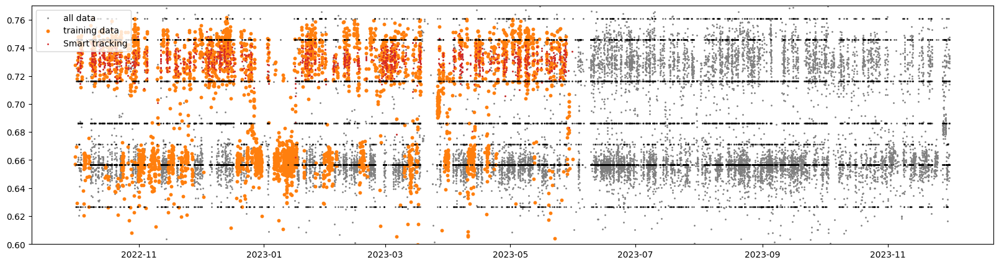

In [27]:
smart_tracked_modes_harmonic = smart_tracked_modes.copy()
X_harm = X[(X[X.filter(regex='rpm').columns[0]]>7) &(X[X.filter(regex='rpm').columns[0]]<8)]
smart_tracked_modes_harmonic = smart_tracked_modes_harmonic.loc[X_harm.index.intersection(smart_tracked_modes_harmonic.index)]

plt.figure(figsize=(20,5))
plt.scatter(all_whirling.index, all_whirling['mean_frequency'], s=1, color='gray', label='all data')
#plt.scatter(predictions_df.index, predictions_df['prediction'],color='tab:blue', s=1, alpha=0.5)
#plt.scatter(smart_tracked_modes.index, smart_tracked_modes['frequency'], s=1, color='tab:green', label='Smart tracking')
plt.scatter(y_train.index, y_train, s=10, alpha=1.0, color='tab:orange', label='training data')
#plt.scatter(smart_tracked_modes.index, smart_tracked_modes['frequency'], s=1, color='tab:blue', label='Smart tracking')
plt.scatter(smart_tracked_modes_harmonic.index, smart_tracked_modes_harmonic['frequency'], s=1, color='tab:red', label='Smart tracking')
for harmonic in harmonics_data.columns[:-1]:
    plt.scatter(harmonics_data[harmonic].index, harmonics_data[harmonic], color='k', alpha=0.5, s=1)
#plt.scatter(predictions_df.index, predictions_df['prediction'], s=1, alpha=0.5)
plt.legend(loc='upper left')
plt.ylim(0.6, 0.77)
plt.show()
plt.close()

In [28]:
import pandas as pd
from sklearn.metrics import mean_squared_error

def sparcity_plot_values_smart_tracked(prediction_df_, smart_tracked_modes_full):
    prediction_df = prediction_df_.copy()
    smart_tracked_modes_ = smart_tracked_modes_full.copy()


    # Pre-compute the order of dropping based on 'knowledge_uncertainty'
    drop_order = smart_tracked_modes_['knowledge_uncertainty'].argsort()

    # Pre-calculate the corr for the entire dataset
    initial_mse = mean_squared_error(prediction_df['prediction'].loc[smart_tracked_modes_.index], smart_tracked_modes_['frequency'], squared=False)
    # Pre-allocate memory for sparcity_values
    mse_sparcity_values = [initial_mse] * min(len(predictions_df), len(smart_tracked_modes_))
    prediction_df.reset_index(inplace=True, drop=True)
    smart_tracked_modes_.reset_index(inplace=True, drop=True)
    for i in range(min(len(predictions_df), len(smart_tracked_modes_)) - 1):
        # Drop the next row in the pre-calculated order
        smart_tracked_modes_.drop(drop_order.iloc[-(i+1)], inplace=True)
        prediction_df.drop(drop_order.iloc[-(i+1)], inplace=True)
        # Update the MSE in sparcity_values
        mse_i = mean_squared_error(prediction_df['prediction'].loc[smart_tracked_modes_.index], smart_tracked_modes_['frequency'], squared=False)
        print(drop_order.iloc[-(i+1)], len(prediction_df['prediction'].loc[smart_tracked_modes_.index]), len(smart_tracked_modes_['frequency']), mse_i)
        mse_sparcity_values[i+1] = mse_i
    return mse_sparcity_values

In [29]:
import pandas as pd
from sklearn.metrics import mean_squared_error

def optimized_sparcity_plot_values(prediction_df_, target_):
    prediction_df = prediction_df_.copy()
    target = target_.copy()
    # Pre-compute the order of dropping based on 'knowledge_uncertainty'
    drop_order = prediction_df['knowledge_uncertainty'].argsort()

    # Pre-calculate the MSE for the entire dataset
    initial_mse = mean_squared_error(prediction_df['prediction'], target)

    # Pre-allocate memory for sparcity_values
    sparcity_values = [initial_mse] * len(prediction_df)
    prediction_df.reset_index(inplace=True, drop=True)
    target.reset_index(inplace=True, drop=True)
    for i in range(len(prediction_df) - 1):
        # Drop the next row in the pre-calculated order
        prediction_df.drop(drop_order.iloc[-(i+1)], inplace=True)
        target.drop(drop_order.iloc[-(i+1)], inplace=True)

        # Update the MSE in sparcity_values
        mse_i = mean_squared_error(prediction_df['prediction'], target)
        sparcity_values[i + 1] = mse_i

    return sparcity_values

In [30]:
all_whirling_ = all_whirling.loc[predictions_df.index.intersection(all_whirling.index)]
predictions_df_ = pd.DataFrame(index = all_whirling_.index)
for col in predictions_df:
    predictions_df_[col] = predictions_df[col]

sparcity_values = optimized_sparcity_plot_values(predictions_df_, all_whirling_['mean_frequency'])

In [31]:
smart_tracked_modes_all = smart_tracking(all_whirling_['mean_frequency'], predictions_df_['prediction'], uncertainty_, uncertainty_.max(), prediction_lim)
smart_tracked_modes_all['knowledge_uncertainty'] = predictions_df['knowledge_uncertainty']

In [32]:
mse_sparcity_values = sparcity_plot_values_smart_tracked(predictions_df.dropna(), smart_tracked_modes_all)

3614 4701 4701 0.05620070479463227
4167 4700 4700 0.05620189474402665
3608 4699 4699 0.05620784920194476
3611 4698 4698 0.05621208412110161
3610 4697 4697 0.05621651901527213
4166 4696 4696 0.05622030629952047
3609 4695 4695 0.05622135487022781
4208 4694 4694 0.0562222007096986
4123 4693 4693 0.056219599163600066
411 4692 4692 0.056225563853379776
3646 4691 4691 0.05621781540169462
4178 4690 4690 0.05622345389923268
2800 4689 4689 0.05622706602452451
452 4688 4688 0.05623306248589004
3124 4687 4687 0.05623906041172722
3613 4686 4686 0.05624313252330659
3410 4685 4685 0.056235918905962544
3612 4684 4684 0.056239418001796555
1082 4683 4683 0.05624481662564332
2920 4682 4682 0.056250675791700296
1569 4681 4681 0.056256652111431125
4038 4680 4680 0.056260478543086835
3816 4679 4679 0.056240919761805924
1593 4678 4678 0.056245407862942756
4429 4677 4677 0.05624829460435893
258 4676 4676 0.05625408743023306
2912 4675 4675 0.056259789122312914
2756 4674 4674 0.05626501211121288
3323 4673 4673

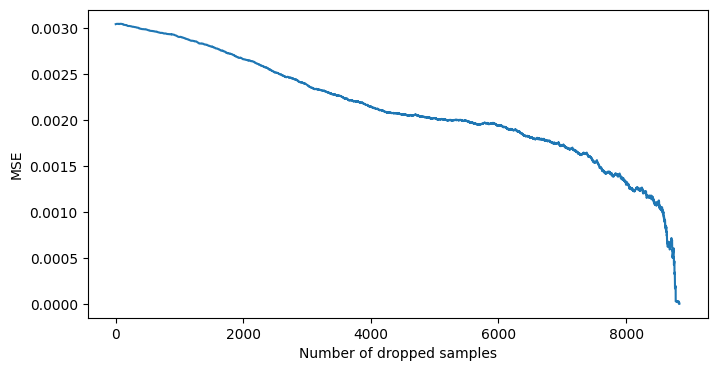

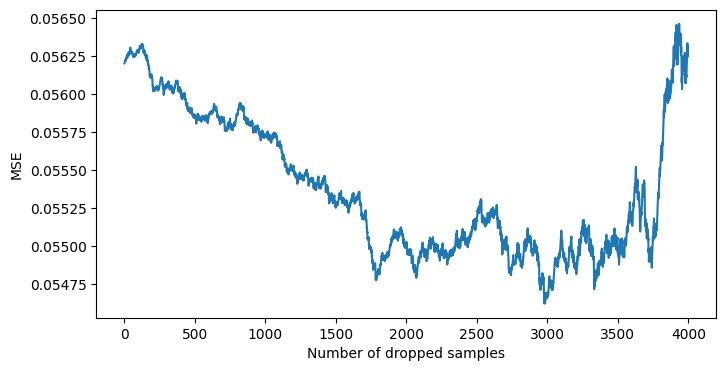

In [33]:
limit = len(sparcity_values)

plt.figure(figsize=(8,4))
plt.plot(sparcity_values[:limit])
plt.xlabel('Number of dropped samples')
plt.ylabel('MSE')
plt.show()
plt.close()

plt.figure(figsize=(8,4))
plt.plot(mse_sparcity_values[1:4000])
plt.xlabel('Number of dropped samples')
plt.ylabel('MSE')
plt.show()
plt.close()

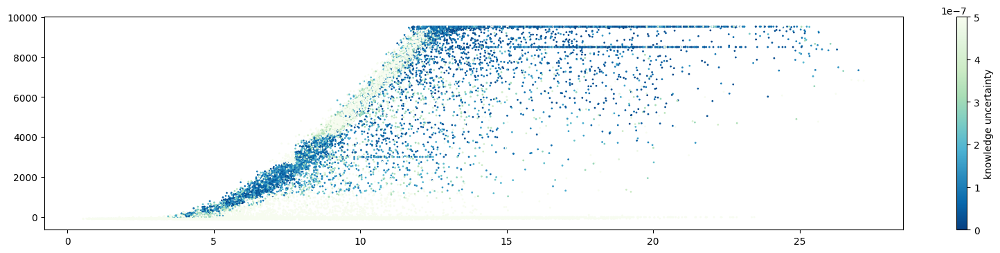

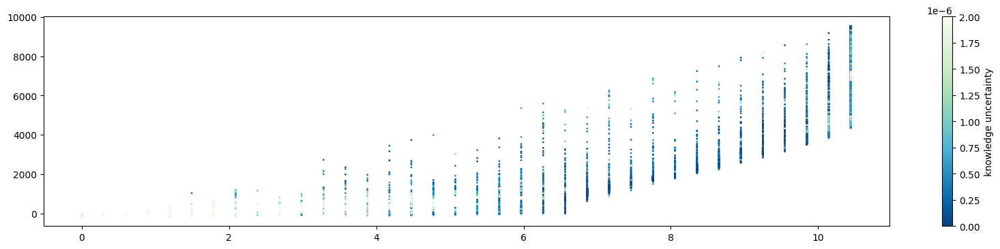

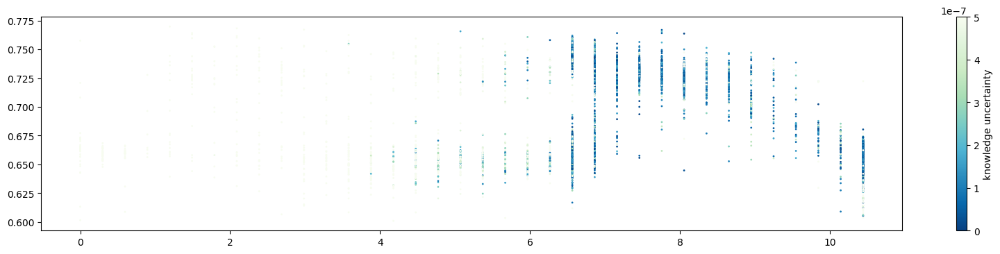

In [34]:
col1 = ['mean_NW2_C02_windspeed']
col2 = ['mean_NW2_C02_power']

plt.figure(figsize=(20,4))
plt.scatter(X[col1], X[col2], c=predictions_df['knowledge_uncertainty'], s=1, alpha=1.0, cmap='GnBu_r', clim=(0, 0.5e-6))
cbar = plt.colorbar()
cbar.set_label('knowledge uncertainty')
plt.show()
plt.close()

col1 = ['mean_NW2_C02_rpm']
col2 = ['mean_NW2_C02_power']

plt.figure(figsize=(20,4))
plt.scatter(X[col1], X[col2], c=predictions_df['knowledge_uncertainty'], s=1, alpha=1.0, cmap='GnBu_r', clim=(0, 2e-6))
cbar = plt.colorbar()
cbar.set_label('knowledge uncertainty')
plt.show()
plt.close()

col = ['mean_NW2_C02_rpm']
all_whirling_[col] = X[col]
all_whirling_['uncertainty'] = predictions_df['knowledge_uncertainty']

plt.figure(figsize=(20,4))
plt.scatter(all_whirling_[col], all_whirling_['mean_frequency'], c=all_whirling_['uncertainty'], s=1, alpha=1.0, cmap='GnBu_r', clim=(0, 0.5e-6))
cbar = plt.colorbar()
cbar.set_label('knowledge uncertainty')
plt.show()
plt.close()